---
title: Laplacian Image Blending using OpenCV
author: "Guntas Singh Saran"
date: "2024-10-22"
format:
    html:
        code-fold: false
        code-tools: true
jupyter: python3
image: "output1.png"
categories: ["Computer Vision"]

---

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from latex import latexify

latexify(columns = 2)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Helper Function for Plotting

In [32]:
def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M==1:
        row_size = figsize
        col_size = figsize//4
    elif N==1:
        row_size = figsize//4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()

### Feathered Mask

In [9]:
def get_feathered_mask(image, mid, feather):
    """
    image (np.ndarray): The image to be masked
    mid : Defines the midline of the mask
    feather : Defines the feather width of the mask - region where there is a smooth transition from 0 to 255
    """
    height, width = image.shape[:2]
    
    midline = int(width / mid)
    feather_width = int(width / feather)

    mask = np.zeros((height, width), dtype=np.uint8)    
    mask[:, :midline - feather_width // 2] = 255
    
    for i in range(midline - feather_width // 2, midline + feather_width // 2):
        feather_factor = (midline + feather_width // 2 - i) / feather_width
        mask[:, i] = np.clip(255 * feather_factor, 0, 255)
    
    return mask

In [95]:
orange = cv2.imread('./images/orange.png', 1)
apple = cv2.imread('./images/apple.png', 1)

# Feathered Mask
mask = get_feathered_mask(orange, 2, 10)
print(orange.shape, apple.shape, mask.shape)

(448, 624, 3) (448, 624, 3) (448, 624)


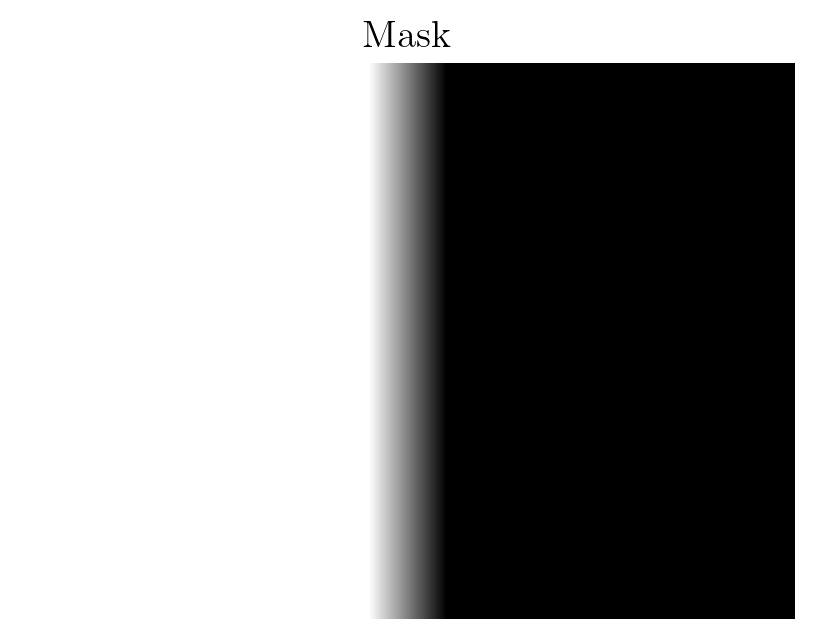

In [86]:
plt.figure(figsize=(5, 5))
plt.title("Mask", fontsize = 14)
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

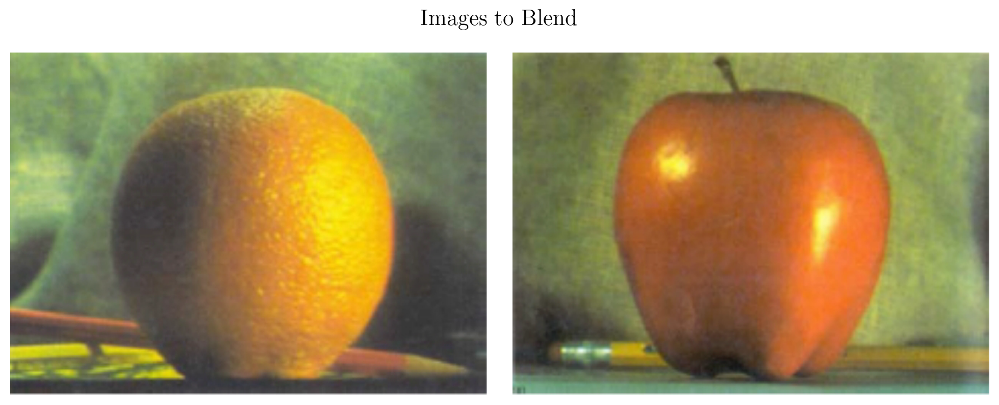

In [87]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle('Images to Blend', fontsize = 16)
axes[0].imshow(cv2.cvtColor(orange, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(apple, cv2.COLOR_BGR2RGB))
axes[1].axis('off')
plt.tight_layout()
plt.show()

### Helper Functions to Display the Gaussian Pyramid

In [88]:
def pad_to_original_size(image, original_shape):
    original_h, original_w = original_shape[:2]
    h, w = image.shape[:2]
    
    pad_h_top = max((original_h - h) // 2, 0)
    pad_h_bottom = max(original_h - h - pad_h_top, 0)
    pad_w_left = max((original_w - w) // 2, 0)
    pad_w_right = max(original_w - w - pad_w_left, 0)
    
    if image.ndim == 2:
        padded_image = np.pad(image, 
                              ((pad_h_top, pad_h_bottom), 
                               (pad_w_left, pad_w_right)), 
                              mode='constant', constant_values=50)
    else:
        padded_image = np.pad(image, 
                              ((pad_h_top, pad_h_bottom), 
                               (pad_w_left, pad_w_right), 
                               (0, 0)), 
                              mode='constant', constant_values=50)
    return padded_image


def display_pyramid(pyramid_list, title='Pyramid'):
    original_shape = pyramid_list[0].shape
    
    padded_images = [pad_to_original_size(img, original_shape) for img in pyramid_list]
    
    pyramid_display = np.hstack(padded_images)
    
    if pyramid_display.ndim == 2:
        plt.figure(figsize=(8, 8))
        plt.title(title, fontsize = 14)
        plt.imshow(pyramid_display, cmap='gray')
    else:
        plt.figure(figsize=(8, 8))
        plt.title(title, fontsize = 14)
        plt.imshow(cv2.cvtColor(pyramid_display, cv2.COLOR_BGR2RGB))
    
    plt.axis('off')
    plt.show()

## Gaussian Pyramid and Laplacian Pyramid
Great Source: https://becominghuman.ai/image-blending-using-laplacian-pyramids-2f8e9982077f

In [89]:
def gaussian_pyramid_opencv(image, levels, req_blur = False):
    if req_blur:
        image = cv2.GaussianBlur(image, (3, 3), 1)
    pyramid = [image]
    for _ in range(levels - 1):
        h, w = image.shape[:2]
        image = cv2.resize(image, (w // 2, h // 2), interpolation=cv2.INTER_AREA)
        pyramid.append(image)
    return pyramid

def laplacian_pyramid(image, levels):
    gaussian_pyr = gaussian_pyramid_opencv(image, levels)
    laplacian_pyr = []
    upsampled_pyr = []
    
    for i in range(levels - 1):
        h, w = gaussian_pyr[i].shape[:2]
        upsampled = cv2.resize(gaussian_pyr[i + 1], (w, h), interpolation=cv2.INTER_LINEAR)
        upsampled = cv2.GaussianBlur(upsampled, (3, 3), 1)
        
        laplacian = cv2.subtract(gaussian_pyr[i], upsampled)
        laplacian_pyr.append(laplacian)
        upsampled_pyr.append(upsampled)
    
    return laplacian_pyr, upsampled_pyr

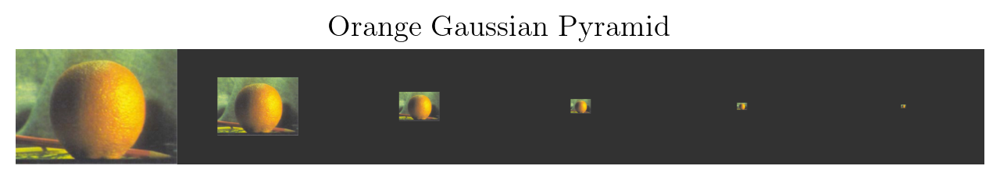

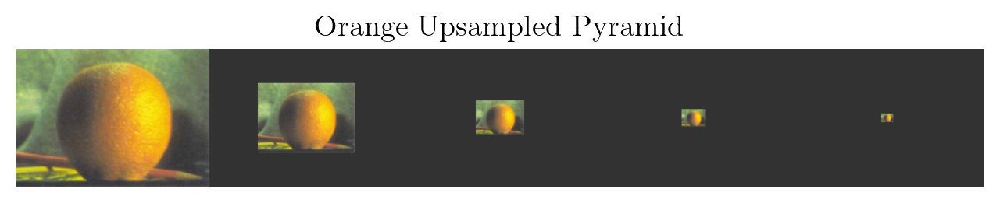

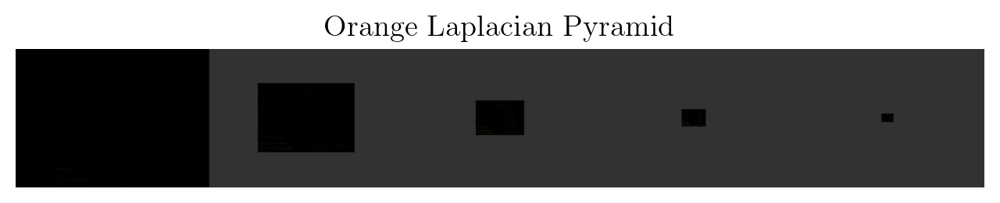

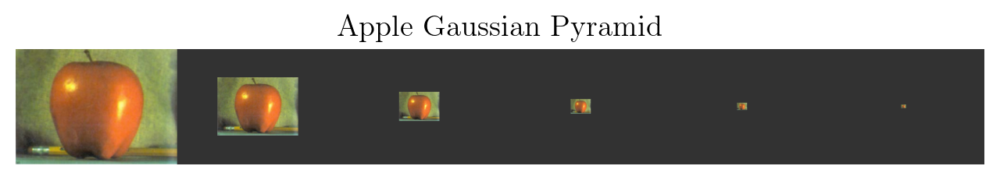

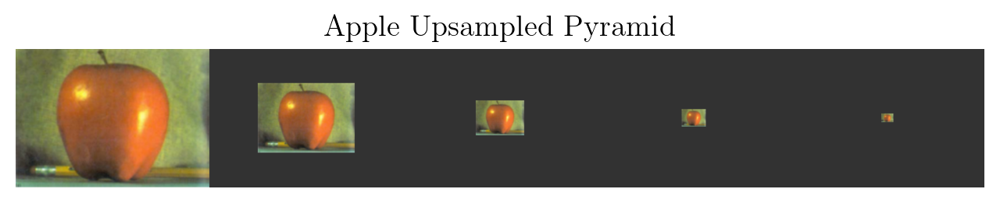

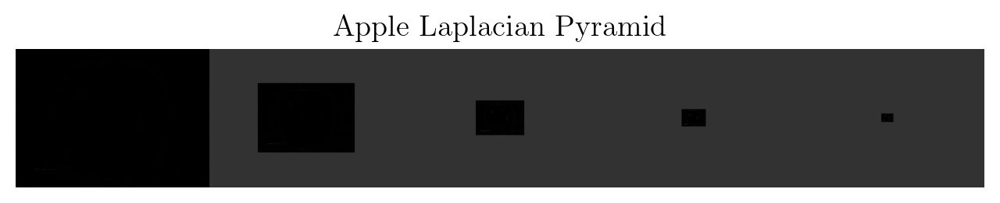

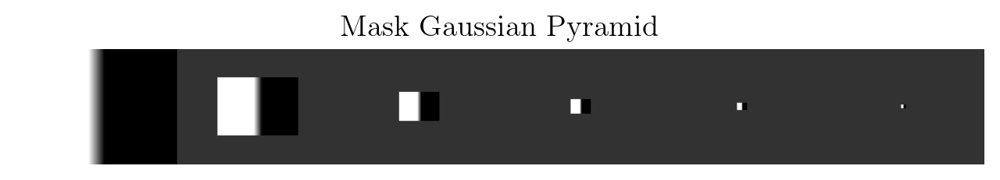

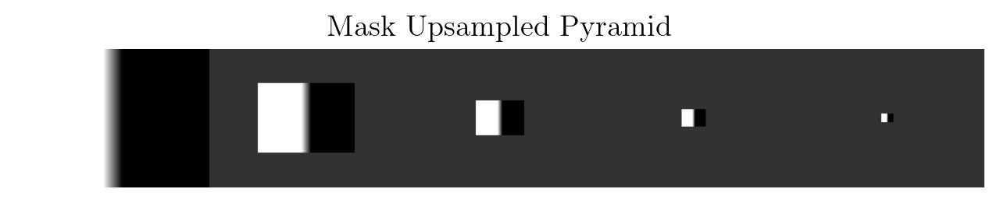

In [90]:
gaussian_py_orange = gaussian_pyramid_opencv(orange, levels=6)
gaussian_py_apple = gaussian_pyramid_opencv(apple, levels=6)
gaussian_py_mask = gaussian_pyramid_opencv(mask, levels=6)

laplacian_py_apple, upsampled_py_apple = laplacian_pyramid(apple, levels=6)
laplacian_py_orange, upsampled_py_orange = laplacian_pyramid(orange, levels=6)
laplacian_py_mask, upsampled_py_mask = laplacian_pyramid(mask, levels=6)

display_pyramid(gaussian_py_orange, 'Orange Gaussian Pyramid')
display_pyramid(upsampled_py_orange, 'Orange Upsampled Pyramid')
display_pyramid(laplacian_py_orange, 'Orange Laplacian Pyramid')

display_pyramid(gaussian_py_apple, 'Apple Gaussian Pyramid')
display_pyramid(upsampled_py_apple, 'Apple Upsampled Pyramid')
display_pyramid(laplacian_py_apple, 'Apple Laplacian Pyramid')

display_pyramid(gaussian_py_mask, 'Mask Gaussian Pyramid')
display_pyramid(upsampled_py_mask, 'Mask Upsampled Pyramid')

In [91]:
print(f"Gaussian Pyramid -> {[img.shape for img in gaussian_py_orange]}")
print(f"Upsampled Pyramid -> {[img.shape for img in upsampled_py_orange]}")
print(f"Laplacian Pyramid -> {[img.shape for img in laplacian_py_orange]}")
print(f"Gaussian Pyramid (Mask) -> {[img.shape for img in gaussian_py_mask]}")

Gaussian Pyramid -> [(448, 624, 3), (224, 312, 3), (112, 156, 3), (56, 78, 3), (28, 39, 3), (14, 19, 3)]
Upsampled Pyramid -> [(448, 624, 3), (224, 312, 3), (112, 156, 3), (56, 78, 3), (28, 39, 3)]
Laplacian Pyramid -> [(448, 624, 3), (224, 312, 3), (112, 156, 3), (56, 78, 3), (28, 39, 3)]
Gaussian Pyramid (Mask) -> [(448, 624), (224, 312), (112, 156), (56, 78), (28, 39), (14, 19)]


## The Laplacian Blending

In [96]:
def reconstruct_image_from_pyramid(reconstructed_image, laplacian_pyr):
    reconstructions = [reconstructed_image]
    
    for i in range(len(laplacian_pyr) - 1, -1, -1):
        h, w = laplacian_pyr[i].shape[:2]
        upsampled = cv2.resize(reconstructed_image, (w, h), interpolation=cv2.INTER_LINEAR)
        upsampled = cv2.GaussianBlur(upsampled, (3, 3), 1)
        reconstructed_image = cv2.add(upsampled, laplacian_pyr[i])
        reconstructions.append(reconstructed_image)
    
    return reconstructions

def laplacian_pyramid_blend_images(image_a, image_b, mask, levels):
    
    # Gaussian pyramids for the mask
    gaussian_mask_pyr = gaussian_pyramid_opencv(mask, levels)[:-1]
    
    # Laplacian pyramids for the two images
    laplacian_pyr_a, upsampled_a = laplacian_pyramid(image_a, levels)
    laplacian_pyr_b, upsampled_b = laplacian_pyramid(image_b, levels)
    
    # as stated in the source, the last step is a bit different requiring to add 3 images
    final_upsampled_a, final_upsampled_b = upsampled_a[-1], upsampled_b[-1]
    final_gaussian_mask = gaussian_mask_pyr[-1]
    final_part = final_gaussian_mask * final_upsampled_a + (1.0 - final_gaussian_mask) * final_upsampled_b
    
    blended_pyr = []
    
    # Blend each level of the Laplacian pyramids
    for lap_a, lap_b, mask in zip(laplacian_pyr_a, laplacian_pyr_b, gaussian_mask_pyr):
 
        blended_lap = lap_a * mask + lap_b * (1.0 - mask)
        blended_pyr.append(blended_lap)
        
    reconstructed_image = cv2.add(final_part, blended_pyr[-1])
    
    # Reconstruct the final blended image from the blended pyramid
    blended_images = reconstruct_image_from_pyramid(reconstructed_image, blended_pyr[:-1])
    blended_images = [np.clip(img, 0, 255).astype(np.uint8) for img in blended_images]
    
    return blended_images

In [97]:
mask = get_feathered_mask(orange, 2, 10)
mask = mask / 255.0
mask = np.expand_dims(mask, axis=-1)  # (h, w, 1)
mask = np.repeat(mask, 3, axis=-1)     # (h, w, 3)
print(mask.shape)
blended_images = laplacian_pyramid_blend_images(apple, orange, mask, levels=6)
blended_image = blended_images[-1]
print(blended_image.shape)

(448, 624, 3)
(448, 624, 3)


In [98]:
print([img.shape for img in blended_images])

[(28, 39, 3), (56, 78, 3), (112, 156, 3), (224, 312, 3), (448, 624, 3)]


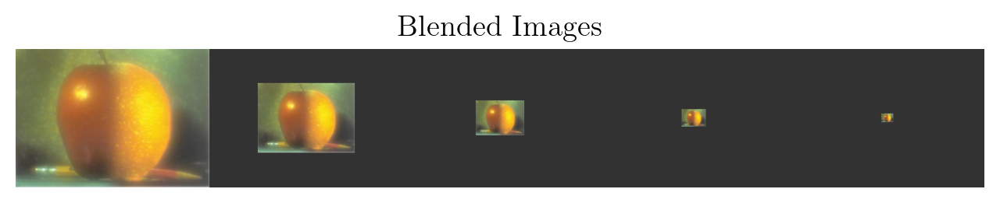

In [99]:
display_pyramid(blended_images[::-1], 'Blended Images')

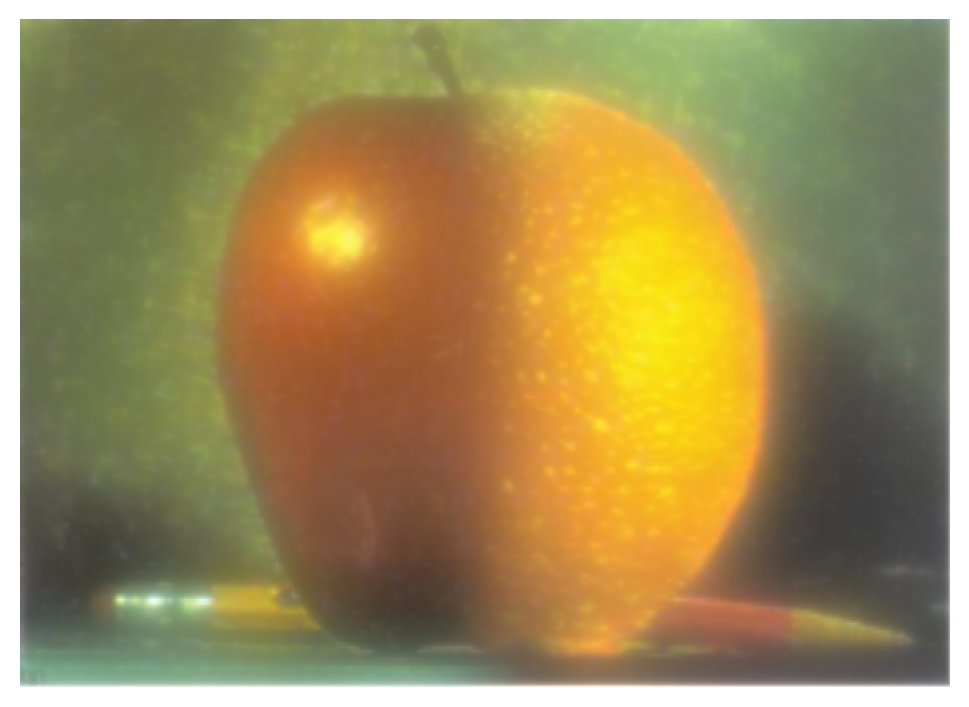

In [100]:
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### Gamma Correction

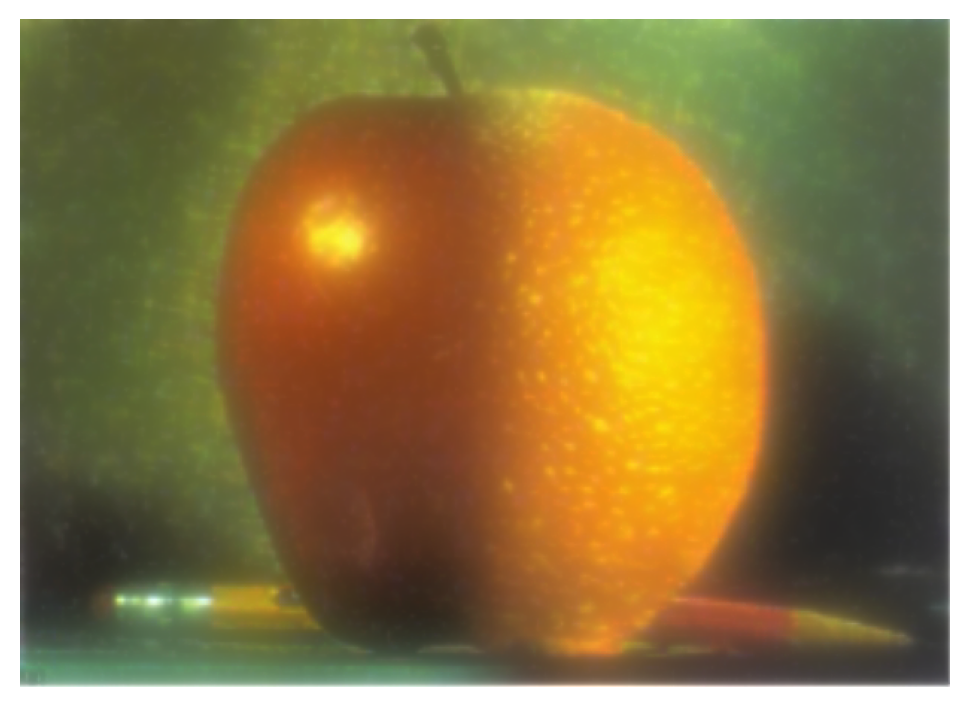

In [107]:
gamma = 1.3
corrected_image = np.power(blended_image / 255.0, gamma) * 255
corrected_image = np.clip(corrected_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

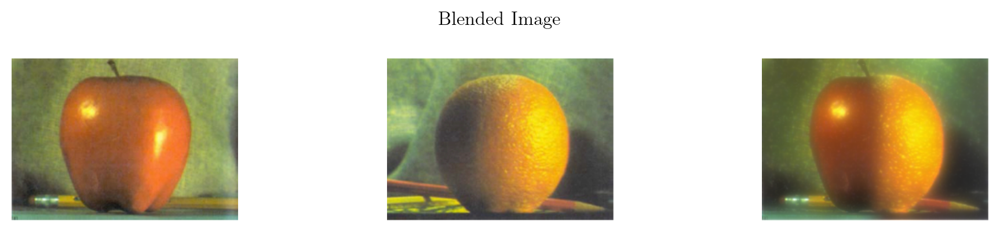

In [108]:
collage = np.array([apple, orange, corrected_image])
show_image_grid(collage, 1, 3, title='Blended Image', figsize=10)

### Some More Examples for Blending 
Image Source: https://github.com/max-kazak/CP_Pyramid_Blending

In [109]:
doll_white = cv2.imread('./images/Doll_White.jpg', 1)
doll_black = cv2.imread('./images/Doll_Black.jpg', 1)
mask_doll = cv2.imread('./images/Mask_Doll.jpg', 0)
print(doll_white.shape, doll_black.shape, mask_doll.shape)

(812, 679, 3) (812, 679, 3) (812, 679)


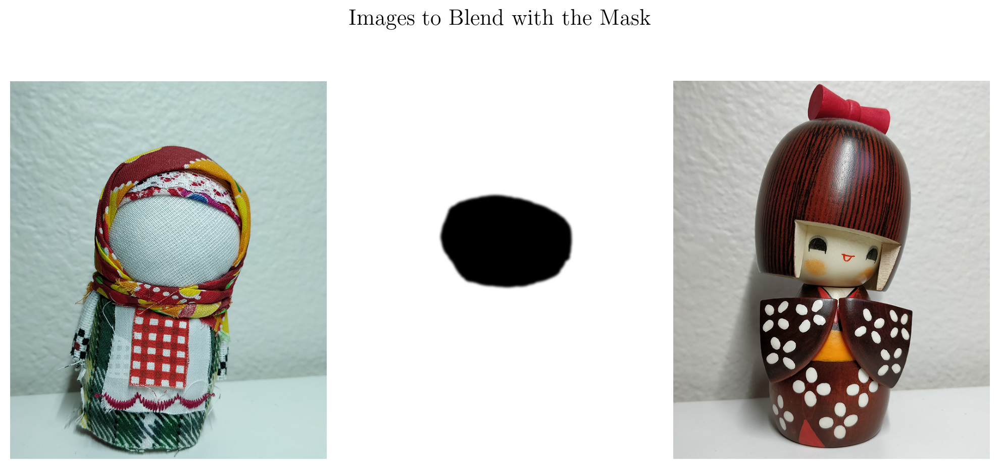

In [110]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5))
fig.suptitle('Images to Blend with the Mask', fontsize = 16)
axes[0].imshow(cv2.cvtColor(doll_white, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(mask_doll, cv2.COLOR_BGR2RGB))
axes[1].axis('off')
axes[2].imshow(cv2.cvtColor(doll_black, cv2.COLOR_BGR2RGB))
axes[2].axis('off')
plt.tight_layout()
plt.show()

In [111]:
mask = mask_doll / 255.0
mask = np.expand_dims(mask, axis=-1)
mask = np.repeat(mask, 3, axis=-1)
blended_images = laplacian_pyramid_blend_images(doll_white, doll_black, mask, levels=5)
blended_image = blended_images[-1]

[(812, 679, 3), (406, 339, 3), (203, 169, 3), (101, 84, 3)]


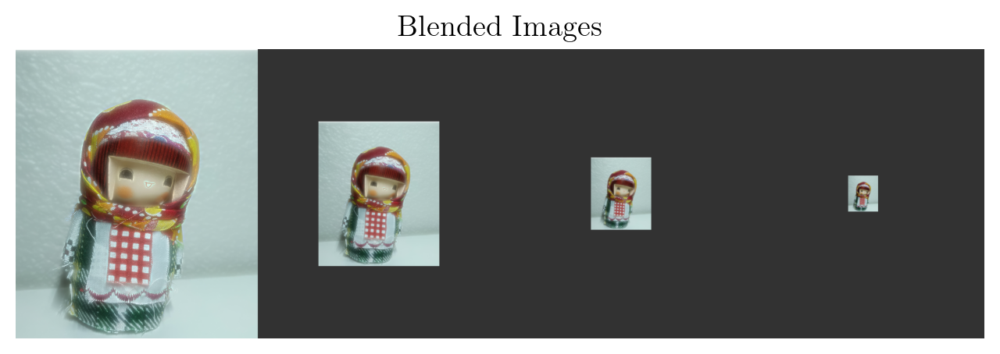

In [112]:
print([img.shape for img in blended_images[::-1]])
display_pyramid(blended_images[::-1], 'Blended Images')

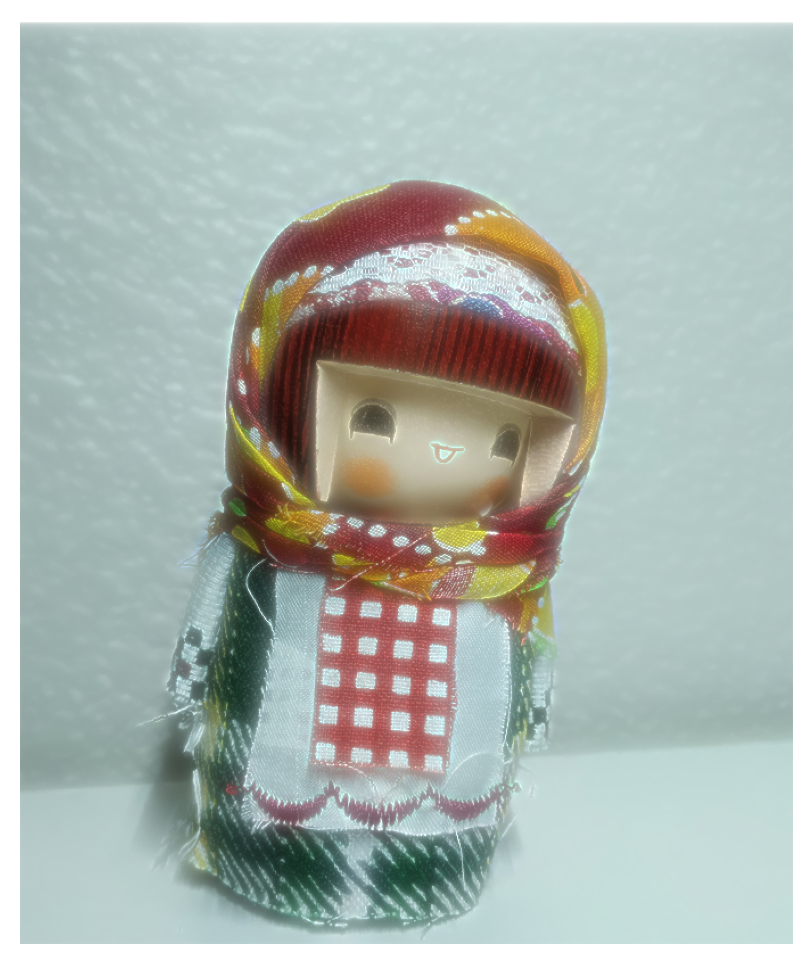

In [113]:
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

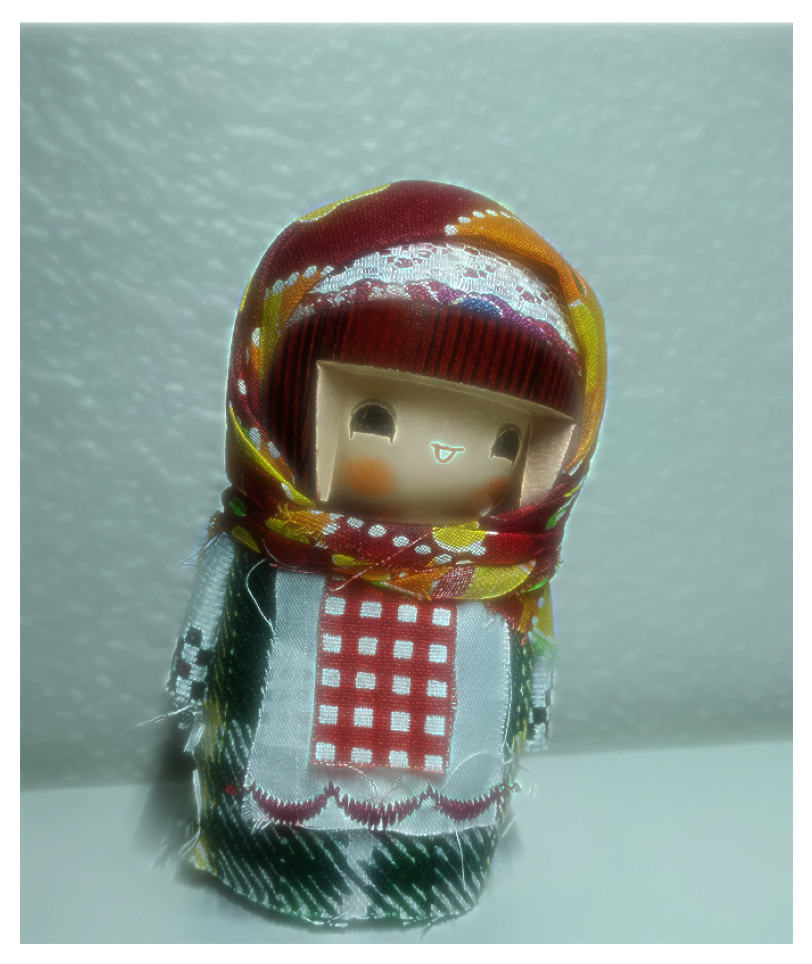

In [118]:
gamma = 1.5
corrected_image = np.power(blended_image / 255.0, gamma) * 255
corrected_image = np.clip(corrected_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

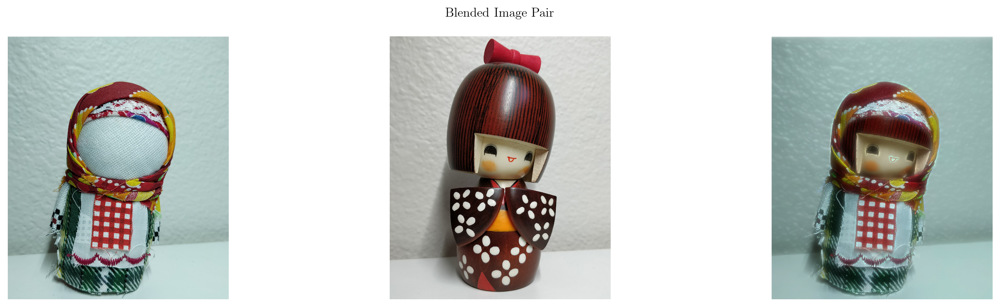

In [119]:
collage = np.array([doll_white, doll_black, corrected_image])
show_image_grid(collage, 1, 3, 'Blended Image Pair', figsize=16)

In [120]:
dog_black = cv2.imread('./images/Puppy_Black.jpg', 1)
cat_white = cv2.imread('./images/Kitty_White.jpg', 1)
# Feathered Mask
mask_dc = get_feathered_mask(dog_black, 1.7, 20)
print(dog_black.shape, cat_white.shape, mask_dc.shape)

(600, 800, 3) (600, 800, 3) (600, 800)


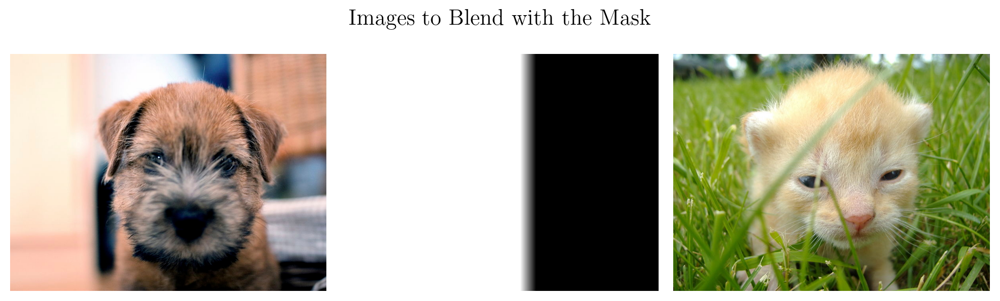

In [121]:
fig, axes = plt.subplots(1, 3, figsize=(10, 3))
fig.suptitle('Images to Blend with the Mask', fontsize = 16)
axes[0].imshow(cv2.cvtColor(dog_black, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(mask_dc, cv2.COLOR_BGR2RGB))
axes[1].axis('off')
axes[2].imshow(cv2.cvtColor(cat_white, cv2.COLOR_BGR2RGB))
axes[2].axis('off')
plt.tight_layout()
plt.show()

In [122]:
mask = mask_dc / 255.0
mask = np.expand_dims(mask, axis=-1)
mask = np.repeat(mask, 3, axis=-1)
blended_images = laplacian_pyramid_blend_images(dog_black, cat_white, mask, levels=5)
blended_image = blended_images[-1]

[(600, 800, 3), (300, 400, 3), (150, 200, 3), (75, 100, 3)]


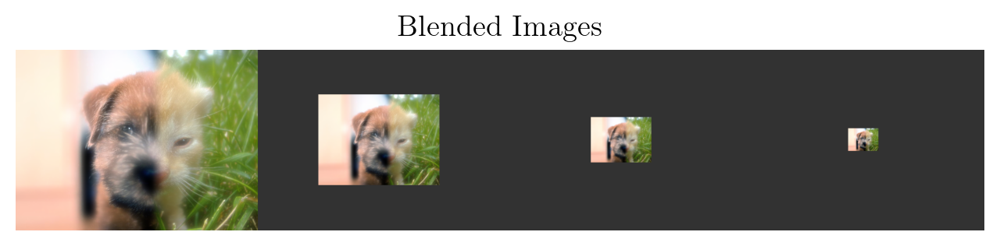

In [123]:
print([img.shape for img in blended_images[::-1]])
display_pyramid(blended_images[::-1], 'Blended Images')

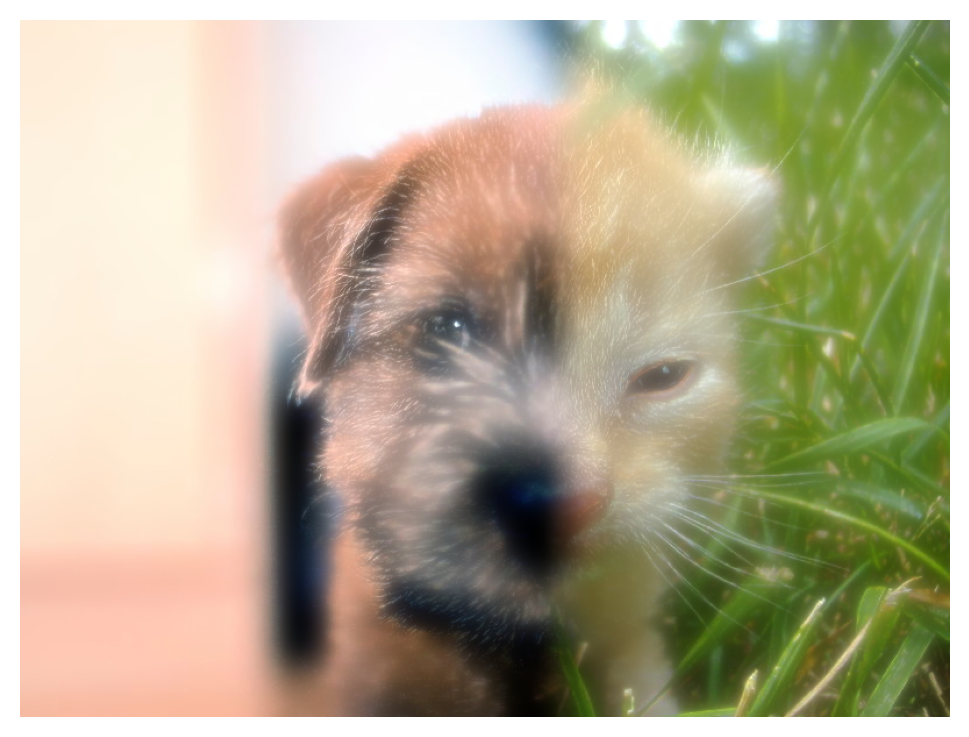

In [124]:
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

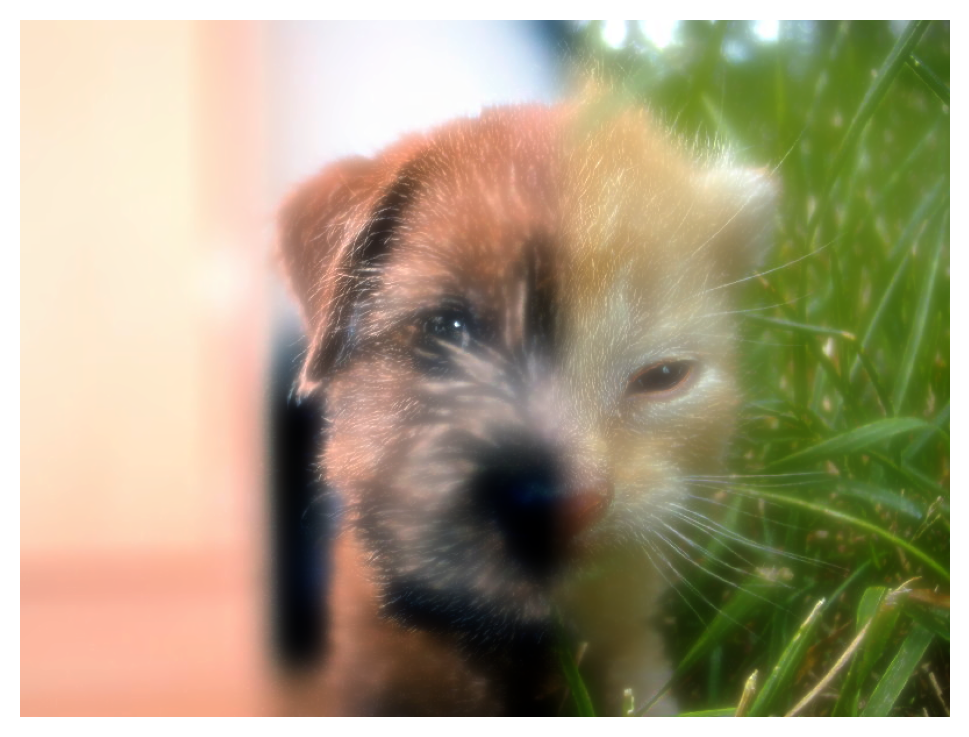

In [125]:
gamma = 1.3
corrected_image = np.power(blended_image / 255.0, gamma) * 255
corrected_image = np.clip(corrected_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

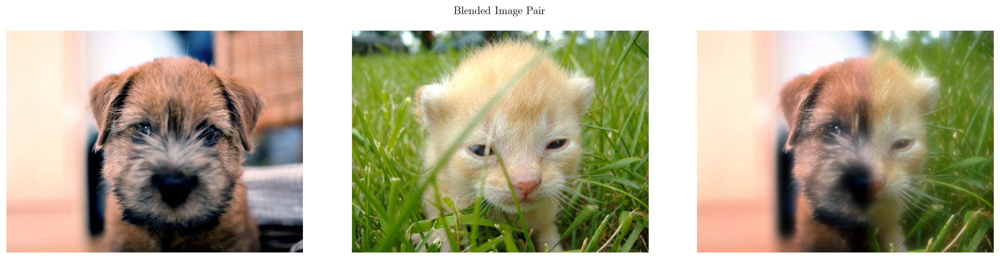

In [126]:
collage = np.array([dog_black, cat_white, corrected_image])
show_image_grid(collage, 1, 3, 'Blended Image Pair', figsize=16)